<a href="https://colab.research.google.com/github/SHREEMATHI-S/TIME-SERIES/blob/main/Time_component_and_perform_time_series_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
plt.style.use("dark_background")
plt.rcParams.update({'figure.figsize': (40, 10), 'font.size': 24})

In [7]:
from google.colab import files
uploads1 = files.upload()

Saving dataset_tk.csv to dataset_tk.csv


In [8]:
import io

# Load each file into a pandas DataFrame using the uploaded content
ds = pd.read_csv(io.BytesIO(uploads1['dataset_tk.csv']))

In [9]:
ds["date"], ds["tn"] = ds[ds.columns[0]], ds["Tamil Nadu"]

In [10]:
ds.drop(ds.columns[:-2], axis = 1, inplace = True)

In [11]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503 entries, 0 to 502
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    503 non-null    object 
 1   tn      503 non-null    float64
dtypes: float64(1), object(1)
memory usage: 8.0+ KB


In [12]:
ds

,date,tn
0,02/01/2019 00:00:00,268.3
1,03/01/2019 00:00:00,285.2
2,04/01/2019 00:00:00,270.3
3,05/01/2019 00:00:00,286.8
4,06/01/2019 00:00:00,298.3
...,...,...
498,01/12/2020 00:00:00,357.3
499,02/12/2020 00:00:00,356.9
500,03/12/2020 00:00:00,355.1
501,04/12/2020 00:00:00,353.5


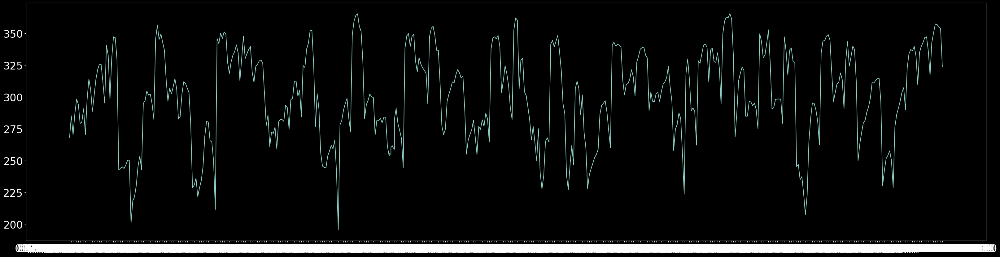

In [13]:
plt.plot(ds["date"], ds["tn"])

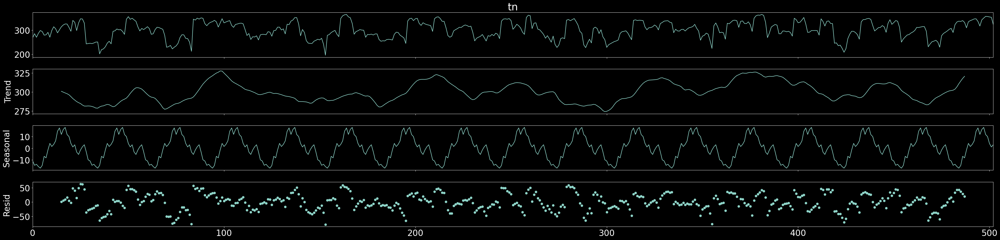

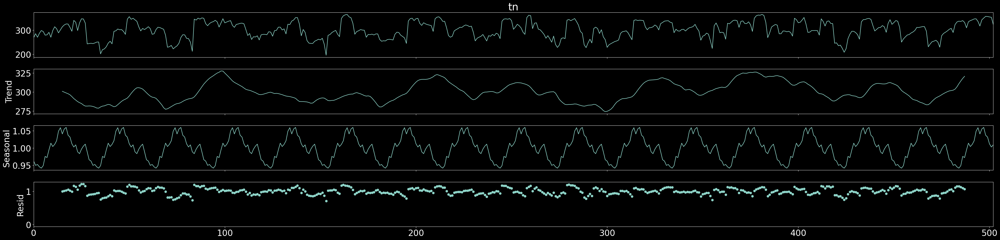

In [14]:
from statsmodels.tsa.seasonal import seasonal_decompose

seasonal_decompose(ds["tn"], model='additive', period = 30).plot().show()
m = seasonal_decompose(ds["tn"], model='multiplicative', period = 30)
m.plot().show()

In [15]:
from statsmodels.tsa.stattools import adfuller, kpss

def adf_test(result):
    print('ADF Statistic: %f' % result[0])
    print('p-value: %.18f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    print ("\n stationary \n" if result[1] < 0.05 else "\n Non stationary \n")

def kpss_test(result):
    print('kpss Statistic: %f' % result[0])
    print('p-value: %.18f' % result[1])
    print('Critical Values:')
#     for key, value in result[4].items():
#         print('\t%s: %.3f' % (key, value))

    print ("\n stationary \n" if result[1] < 0.05 else "\n Non stationary \n")
adf_test(adfuller(ds["tn"]))
kpss_test(kpss(ds["tn"]))

ADF Statistic: -7.304888
p-value: 0.000000000130936143
Critical Values:
	1%: -3.443
	5%: -2.867
	10%: -2.570

 stationary 

kpss Statistic: 0.204046
p-value: 0.100000000000000006
Critical Values:

 Non stationary 



<ipython-input-15-8e315c02c39d>:21: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test(kpss(ds["tn"]))


<Axes: >

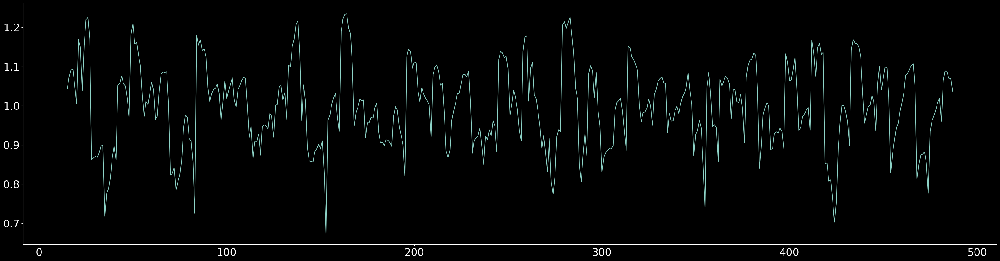

In [16]:
(ds["tn"] / m.trend).plot()

<Axes: >

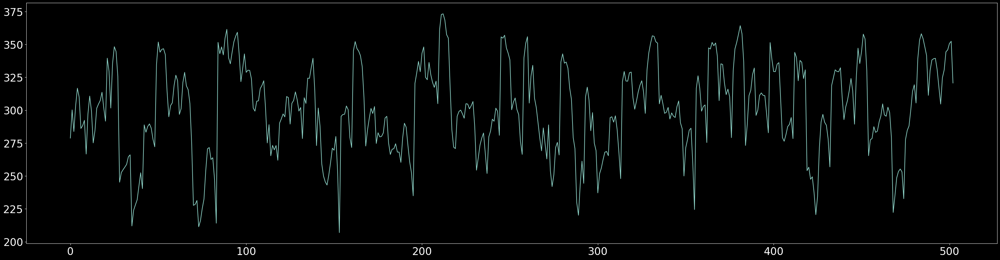

In [17]:
(ds["tn"] / m.seasonal).plot()

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

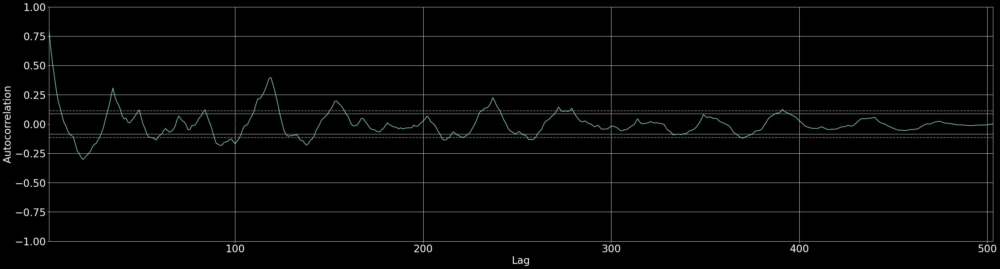

In [18]:
pd.plotting.autocorrelation_plot(ds["tn"])

Figure(4000x1000)


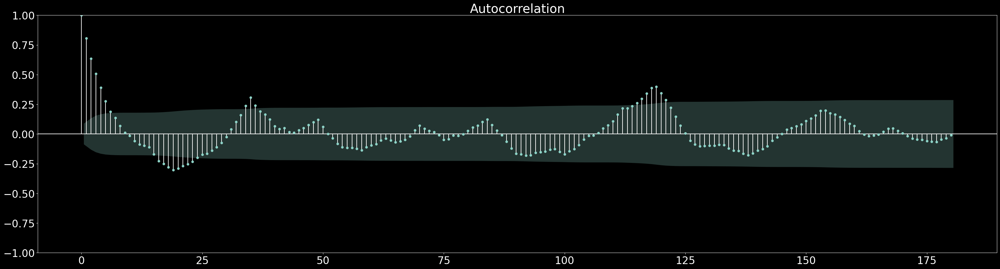

In [19]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

print (plot_acf(ds["tn"], lags = 180))

Figure(4000x1000)


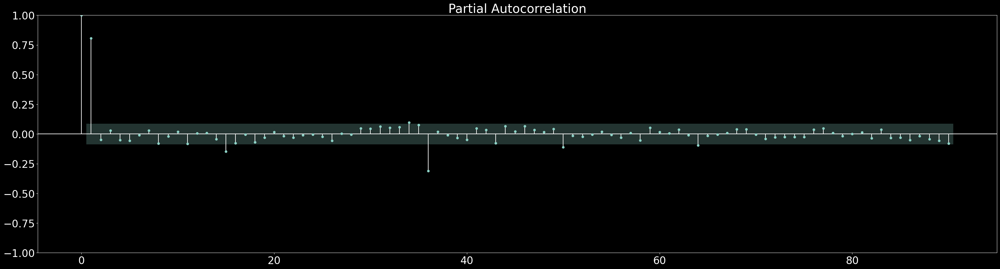

In [20]:
print (plot_pacf(ds["tn"], lags = 90))

In [21]:
df = pd.read_csv(io.BytesIO(uploads1['dataset_tk.csv']))
df.head()

,Unnamed: 0,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,Chhattisgarh,Gujarat,MP,Maharashtra,Goa,DNH,Andhra Pradesh,Telangana,Karnataka,Kerala,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur,Meghalaya,Mizoram,Nagaland,Tripura
0,02/01/2019 00:00:00,119.9,130.3,234.1,85.8,313.9,40.7,30.0,52.5,5.0,78.7,319.5,253.0,428.6,12.8,18.6,164.6,204.2,206.3,72.7,268.3,6.3,82.3,24.8,70.2,108.2,2.0,2.1,21.7,2.7,6.1,1.9,2.2,3.4
1,03/01/2019 00:00:00,121.9,133.5,240.2,85.5,311.8,39.3,30.1,54.1,4.9,78.8,316.7,253.6,419.6,13.7,18.2,170.1,204.5,212.2,73.6,285.2,6.5,82.0,25.6,67.9,110.2,1.9,2.2,23.4,2.4,6.5,1.8,2.2,3.6
2,04/01/2019 00:00:00,118.8,128.2,239.8,83.5,320.7,38.1,30.1,53.2,4.8,74.8,301.9,239.3,395.8,12.6,16.7,165.2,201.2,205.3,73.4,270.3,6.4,82.9,26.3,66.3,106.8,1.7,2.2,21.7,2.4,6.3,1.7,2.2,3.5
3,05/01/2019 00:00:00,121.0,127.5,239.1,79.2,299.0,39.2,30.2,51.5,4.3,69.0,313.2,228.2,411.1,13.0,17.6,167.4,201.7,212.4,75.4,286.8,6.6,77.0,23.0,65.8,107.0,2.0,2.2,22.5,2.7,5.7,1.8,2.3,3.5
4,06/01/2019 00:00:00,121.4,132.6,240.4,76.6,286.8,39.2,31.0,53.2,4.3,68.1,320.7,227.4,408.6,12.9,18.6,171.2,194.9,217.5,75.4,298.3,7.2,76.4,22.6,62.9,106.4,2.0,2.2,21.7,2.7,6.2,1.9,2.3,3.3


In [22]:
df = df.rename(columns={'Unnamed: 0': 'DateTime'})
df['DateTime'] = pd.to_datetime(df['DateTime'],format="%d/%m/%Y %H:%M:%S")
df['Date'] = pd.to_datetime(df['DateTime']).dt.date
df.tail()

,DateTime,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,Chhattisgarh,Gujarat,MP,Maharashtra,Goa,DNH,Andhra Pradesh,Telangana,Karnataka,Kerala,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur,Meghalaya,Mizoram,Nagaland,Tripura,Date
498,2020-12-01,130.8,126.0,220.4,77.3,322.8,36.5,25.4,45.4,3.6,100.4,370.5,208.1,494.1,12.0,18.1,196.5,227.7,248.6,86.4,357.3,8.5,82.9,26.3,105.7,172.6,1.4,2.1,20.4,2.1,5.4,1.8,2.0,2.4,2020-12-01
499,2020-12-02,129.4,127.3,218.4,81.3,331.4,37.0,25.8,45.2,3.7,101.8,377.4,209.8,492.8,12.0,18.2,197.6,219.5,246.5,84.7,356.9,8.5,85.0,25.2,112.3,174.4,1.5,2.1,23.3,2.4,5.4,1.6,2.1,3.3,2020-12-02
500,2020-12-03,132.1,129.7,205.6,85.6,336.7,37.8,26.2,45.2,4.0,103.0,379.8,205.2,472.8,12.0,18.4,197.3,212.5,242.8,83.9,355.1,8.7,85.4,24.0,113.0,169.8,1.4,2.1,21.7,2.3,5.4,1.5,2.0,3.6,2020-12-03
501,2020-12-04,132.1,128.4,207.0,83.9,334.6,38.2,27.0,43.0,4.0,101.8,377.2,203.3,475.3,12.0,18.2,186.1,207.2,226.7,85.1,353.5,8.6,70.0,19.3,111.6,145.5,1.2,2.0,24.2,2.5,5.7,1.6,2.0,3.3,2020-12-04
502,2020-12-05,120.4,111.2,201.4,83.6,287.3,35.2,24.3,42.6,3.5,102.4,362.5,200.1,470.5,12.0,18.4,181.9,197.0,218.6,78.7,323.7,7.9,61.7,17.7,95.1,110.4,1.2,2.1,20.3,2.5,5.8,1.6,2.1,3.3,2020-12-05


In [23]:
df.columns

Index(['DateTime', 'Punjab', 'Haryana', 'Rajasthan', 'Delhi', 'UP',
       'Uttarakhand', 'HP', 'J&K', 'Chandigarh', 'Chhattisgarh', 'Gujarat',
       'MP', 'Maharashtra', 'Goa', 'DNH', 'Andhra Pradesh', 'Telangana',
       'Karnataka', 'Kerala', 'Tamil Nadu', 'Pondy', 'Bihar', 'Jharkhand',
       'Odisha', 'West Bengal', 'Sikkim', 'Arunachal Pradesh', 'Assam',
       'Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Tripura', 'Date'],
      dtype='object')

In [24]:
cols = ['Punjab', 'Haryana', 'Rajasthan', 'Delhi', 'UP',
       'Uttarakhand', 'HP', 'J&K', 'Chandigarh', 'Chhattisgarh', 'Gujarat',
       'MP', 'Maharashtra', 'Goa', 'DNH', 'Andhra Pradesh', 'Telangana',
       'Karnataka', 'Kerala', 'Tamil Nadu', 'Pondy', 'Bihar', 'Jharkhand',
       'Odisha', 'West Bengal', 'Sikkim', 'Arunachal Pradesh', 'Assam',
       'Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Tripura', 'Date']

subsetdf = df[cols]

subsetdf.set_index('Date',inplace=True)

cumsum_df = subsetdf.cumsum(axis=0)

cumsum_df

,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,Chhattisgarh,Gujarat,MP,Maharashtra,Goa,DNH,Andhra Pradesh,Telangana,Karnataka,Kerala,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur,Meghalaya,Mizoram,Nagaland,Tripura
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-02,119.9,130.3,234.1,85.8,313.9,40.7,30.0,52.5,5.0,78.7,319.5,253.0,428.6,12.8,18.6,164.6,204.2,206.3,72.7,268.3,6.3,82.3,24.8,70.2,108.2,2.0,2.1,21.7,2.7,6.1,1.9,2.2,3.4
2019-01-03,241.8,263.8,474.3,171.3,625.7,80.0,60.1,106.6,9.9,157.5,636.2,506.6,848.2,26.5,36.8,334.7,408.7,418.5,146.3,553.5,12.8,164.3,50.4,138.1,218.4,3.9,4.3,45.1,5.1,12.6,3.7,4.4,7.0
2019-01-04,360.6,392.0,714.1,254.8,946.4,118.1,90.2,159.8,14.7,232.3,938.1,745.9,1244.0,39.1,53.5,499.9,609.9,623.8,219.7,823.8,19.2,247.2,76.7,204.4,325.2,5.6,6.5,66.8,7.5,18.9,5.4,6.6,10.5
2019-01-05,481.6,519.5,953.2,334.0,1245.4,157.3,120.4,211.3,19.0,301.3,1251.3,974.1,1655.1,52.1,71.1,667.3,811.6,836.2,295.1,1110.6,25.8,324.2,99.7,270.2,432.2,7.6,8.7,89.3,10.2,24.6,7.2,8.9,14.0
2019-01-06,603.0,652.1,1193.6,410.6,1532.2,196.5,151.4,264.5,23.3,369.4,1572.0,1201.5,2063.7,65.0,89.7,838.5,1006.5,1053.7,370.5,1408.9,33.0,400.6,122.3,333.1,538.6,9.6,10.9,111.0,12.9,30.8,9.1,11.2,17.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,70482.2,69085.2,109044.6,41606.1,156670.3,18038.8,13260.5,22088.8,2068.0,41781.2,160992.0,103948.0,215168.4,5531.9,8191.4,87841.5,93229.1,101731.1,35980.4,149882.3,3725.2,41527.1,11906.6,40041.7,69170.1,643.3,1052.6,12465.4,1245.1,2816.5,852.0,1079.5,2041.5
2020-12-02,70611.6,69212.5,109263.0,41687.4,157001.7,18075.8,13286.3,22134.0,2071.7,41883.0,161369.4,104157.8,215661.2,5543.9,8209.6,88039.1,93448.6,101977.6,36065.1,150239.2,3733.7,41612.1,11931.8,40154.0,69344.5,644.8,1054.7,12488.7,1247.5,2821.9,853.6,1081.6,2044.8
2020-12-03,70743.7,69342.2,109468.6,41773.0,157338.4,18113.6,13312.5,22179.2,2075.7,41986.0,161749.2,104363.0,216134.0,5555.9,8228.0,88236.4,93661.1,102220.4,36149.0,150594.3,3742.4,41697.5,11955.8,40267.0,69514.3,646.2,1056.8,12510.4,1249.8,2827.3,855.1,1083.6,2048.4


In [25]:
count_date = cumsum_df.groupby(cumsum_df.index)[['Punjab', 'Haryana', 'Rajasthan', 'Delhi', 'UP',
       'Uttarakhand', 'HP', 'J&K', 'Chandigarh', 'Chhattisgarh', 'Gujarat',
       'MP', 'Maharashtra', 'Goa', 'DNH', 'Andhra Pradesh', 'Telangana',
       'Karnataka', 'Kerala', 'Tamil Nadu', 'Pondy', 'Bihar', 'Jharkhand',
       'Odisha', 'West Bengal', 'Sikkim', 'Arunachal Pradesh', 'Assam',
       'Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Tripura']].sum()

pw_clean = pd.DataFrame(count_date)
pw_clean['Date'] = pd.to_datetime(pw_clean.index)
pw_clean = pw_clean.set_index('Date')

pw_clean.head(20)

,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,Chhattisgarh,Gujarat,MP,Maharashtra,Goa,DNH,Andhra Pradesh,Telangana,Karnataka,Kerala,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur,Meghalaya,Mizoram,Nagaland,Tripura
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-02,119.9,130.3,234.1,85.8,313.9,40.7,30.0,52.5,5.0,78.7,319.5,253.0,428.6,12.8,18.6,164.6,204.2,206.3,72.7,268.3,6.3,82.3,24.8,70.2,108.2,2.0,2.1,21.7,2.7,6.1,1.9,2.2,3.4
2019-01-03,241.8,263.8,474.3,171.3,625.7,80.0,60.1,106.6,9.9,157.5,636.2,506.6,848.2,26.5,36.8,334.7,408.7,418.5,146.3,553.5,12.8,164.3,50.4,138.1,218.4,3.9,4.3,45.1,5.1,12.6,3.7,4.4,7.0
2019-01-04,360.6,392.0,714.1,254.8,946.4,118.1,90.2,159.8,14.7,232.3,938.1,745.9,1244.0,39.1,53.5,499.9,609.9,623.8,219.7,823.8,19.2,247.2,76.7,204.4,325.2,5.6,6.5,66.8,7.5,18.9,5.4,6.6,10.5
2019-01-05,481.6,519.5,953.2,334.0,1245.4,157.3,120.4,211.3,19.0,301.3,1251.3,974.1,1655.1,52.1,71.1,667.3,811.6,836.2,295.1,1110.6,25.8,324.2,99.7,270.2,432.2,7.6,8.7,89.3,10.2,24.6,7.2,8.9,14.0
2019-01-06,603.0,652.1,1193.6,410.6,1532.2,196.5,151.4,264.5,23.3,369.4,1572.0,1201.5,2063.7,65.0,89.7,838.5,1006.5,1053.7,370.5,1408.9,33.0,400.6,122.3,333.1,538.6,9.6,10.9,111.0,12.9,30.8,9.1,11.2,17.3
2019-01-07,721.0,784.2,1435.5,481.7,1826.4,236.6,181.5,317.8,27.3,442.5,1891.4,1431.8,2471.8,77.7,108.0,1004.9,1198.4,1271.1,445.4,1703.1,40.0,475.9,146.2,397.1,647.9,11.1,13.1,132.4,15.4,36.9,10.9,13.5,20.6
2019-01-08,828.5,905.6,1672.7,550.7,2115.8,273.6,210.7,369.0,31.1,516.7,2199.3,1660.6,2870.0,88.6,126.1,1165.7,1389.2,1472.1,513.6,1982.3,46.5,552.1,169.5,460.7,750.8,12.7,15.4,153.1,18.0,43.1,12.7,15.6,23.9
2019-01-09,961.0,1053.8,1869.7,639.9,2374.4,309.5,236.0,406.9,35.0,593.9,2459.3,1823.1,3270.9,100.7,144.1,1328.7,1556.7,1645.7,581.5,2262.7,54.1,608.5,188.7,547.3,882.5,13.8,17.5,178.9,20.3,49.1,14.4,18.0,28.1
2019-01-10,1092.5,1210.8,2069.6,732.7,2658.6,344.8,262.5,438.6,38.9,672.9,2727.6,1982.7,3680.6,112.8,161.9,1497.5,1730.1,1821.7,650.4,2553.5,62.0,678.4,210.5,626.1,1022.6,14.9,19.6,204.7,22.7,55.3,16.1,20.1,32.4


In [26]:
count_date = cumsum_df.groupby(cumsum_df.index)[['Punjab', 'Haryana', 'Rajasthan', 'Delhi', 'UP',
       'Uttarakhand', 'HP', 'J&K', 'Chandigarh', 'Chhattisgarh', 'Gujarat',
       'MP', 'Maharashtra', 'Goa', 'DNH', 'Andhra Pradesh', 'Telangana',
       'Karnataka', 'Kerala', 'Tamil Nadu', 'Pondy', 'Bihar', 'Jharkhand',
       'Odisha', 'West Bengal', 'Sikkim', 'Arunachal Pradesh', 'Assam',
       'Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Tripura']].sum()

pw_clean = pd.DataFrame(count_date)
pw_clean['Date'] = pd.to_datetime(pw_clean.index)
pw_clean = pw_clean.set_index('Date')

pw_clean.head(20)

,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,Chhattisgarh,Gujarat,MP,Maharashtra,Goa,DNH,Andhra Pradesh,Telangana,Karnataka,Kerala,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur,Meghalaya,Mizoram,Nagaland,Tripura
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-02,119.9,130.3,234.1,85.8,313.9,40.7,30.0,52.5,5.0,78.7,319.5,253.0,428.6,12.8,18.6,164.6,204.2,206.3,72.7,268.3,6.3,82.3,24.8,70.2,108.2,2.0,2.1,21.7,2.7,6.1,1.9,2.2,3.4
2019-01-03,241.8,263.8,474.3,171.3,625.7,80.0,60.1,106.6,9.9,157.5,636.2,506.6,848.2,26.5,36.8,334.7,408.7,418.5,146.3,553.5,12.8,164.3,50.4,138.1,218.4,3.9,4.3,45.1,5.1,12.6,3.7,4.4,7.0
2019-01-04,360.6,392.0,714.1,254.8,946.4,118.1,90.2,159.8,14.7,232.3,938.1,745.9,1244.0,39.1,53.5,499.9,609.9,623.8,219.7,823.8,19.2,247.2,76.7,204.4,325.2,5.6,6.5,66.8,7.5,18.9,5.4,6.6,10.5
2019-01-05,481.6,519.5,953.2,334.0,1245.4,157.3,120.4,211.3,19.0,301.3,1251.3,974.1,1655.1,52.1,71.1,667.3,811.6,836.2,295.1,1110.6,25.8,324.2,99.7,270.2,432.2,7.6,8.7,89.3,10.2,24.6,7.2,8.9,14.0
2019-01-06,603.0,652.1,1193.6,410.6,1532.2,196.5,151.4,264.5,23.3,369.4,1572.0,1201.5,2063.7,65.0,89.7,838.5,1006.5,1053.7,370.5,1408.9,33.0,400.6,122.3,333.1,538.6,9.6,10.9,111.0,12.9,30.8,9.1,11.2,17.3
2019-01-07,721.0,784.2,1435.5,481.7,1826.4,236.6,181.5,317.8,27.3,442.5,1891.4,1431.8,2471.8,77.7,108.0,1004.9,1198.4,1271.1,445.4,1703.1,40.0,475.9,146.2,397.1,647.9,11.1,13.1,132.4,15.4,36.9,10.9,13.5,20.6
2019-01-08,828.5,905.6,1672.7,550.7,2115.8,273.6,210.7,369.0,31.1,516.7,2199.3,1660.6,2870.0,88.6,126.1,1165.7,1389.2,1472.1,513.6,1982.3,46.5,552.1,169.5,460.7,750.8,12.7,15.4,153.1,18.0,43.1,12.7,15.6,23.9
2019-01-09,961.0,1053.8,1869.7,639.9,2374.4,309.5,236.0,406.9,35.0,593.9,2459.3,1823.1,3270.9,100.7,144.1,1328.7,1556.7,1645.7,581.5,2262.7,54.1,608.5,188.7,547.3,882.5,13.8,17.5,178.9,20.3,49.1,14.4,18.0,28.1
2019-01-10,1092.5,1210.8,2069.6,732.7,2658.6,344.8,262.5,438.6,38.9,672.9,2727.6,1982.7,3680.6,112.8,161.9,1497.5,1730.1,1821.7,650.4,2553.5,62.0,678.4,210.5,626.1,1022.6,14.9,19.6,204.7,22.7,55.3,16.1,20.1,32.4


In [27]:
pip install bar-chart-race

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 kB 1.2 MB/s eta 0:00:00


In [ ]:
import bar_chart_race as bcr

bcr.bar_chart_race(df=pw_clean, filename =None, figsize= (6,4),title = "State Power Consumption in India")


/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:286: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(self.df_values.columns)
/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([max_val] * len(ax.get_xticks()))


In [28]:
import pandas as pd
pd.set_option("display.max_columns",None)

In [29]:
df1 = df.copy('Deep')
df1.head()

,DateTime,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,Chhattisgarh,Gujarat,MP,Maharashtra,Goa,DNH,Andhra Pradesh,Telangana,Karnataka,Kerala,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur,Meghalaya,Mizoram,Nagaland,Tripura,Date
0,2019-01-02,119.9,130.3,234.1,85.8,313.9,40.7,30.0,52.5,5.0,78.7,319.5,253.0,428.6,12.8,18.6,164.6,204.2,206.3,72.7,268.3,6.3,82.3,24.8,70.2,108.2,2.0,2.1,21.7,2.7,6.1,1.9,2.2,3.4,2019-01-02
1,2019-01-03,121.9,133.5,240.2,85.5,311.8,39.3,30.1,54.1,4.9,78.8,316.7,253.6,419.6,13.7,18.2,170.1,204.5,212.2,73.6,285.2,6.5,82.0,25.6,67.9,110.2,1.9,2.2,23.4,2.4,6.5,1.8,2.2,3.6,2019-01-03
2,2019-01-04,118.8,128.2,239.8,83.5,320.7,38.1,30.1,53.2,4.8,74.8,301.9,239.3,395.8,12.6,16.7,165.2,201.2,205.3,73.4,270.3,6.4,82.9,26.3,66.3,106.8,1.7,2.2,21.7,2.4,6.3,1.7,2.2,3.5,2019-01-04
3,2019-01-05,121.0,127.5,239.1,79.2,299.0,39.2,30.2,51.5,4.3,69.0,313.2,228.2,411.1,13.0,17.6,167.4,201.7,212.4,75.4,286.8,6.6,77.0,23.0,65.8,107.0,2.0,2.2,22.5,2.7,5.7,1.8,2.3,3.5,2019-01-05
4,2019-01-06,121.4,132.6,240.4,76.6,286.8,39.2,31.0,53.2,4.3,68.1,320.7,227.4,408.6,12.9,18.6,171.2,194.9,217.5,75.4,298.3,7.2,76.4,22.6,62.9,106.4,2.0,2.2,21.7,2.7,6.2,1.9,2.3,3.3,2019-01-06


In [30]:
df1['year'] = df1['DateTime'].apply(lambda x : x.year)
df1['Quarter'] = df1['DateTime'].apply(lambda x : x.quarter)
df1['month'] = df1['DateTime'].apply(lambda x : x.month)
df1['day'] = df1['DateTime'].apply(lambda x : x.day)
df1['weekofyear'] = df1['DateTime'].apply(lambda x : x.weekofyear)
df1['hour'] = df1['DateTime'].apply(lambda x : x.hour)
df1['minute'] = df1['DateTime'].apply(lambda x : x.minute)
df1['weekday'] = df1['DateTime'].apply(lambda x : x.day_name())
df1['MonthName'] = df1['DateTime'].apply(lambda x : x.month_name())
df1.head()

,DateTime,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,Chhattisgarh,Gujarat,MP,Maharashtra,Goa,DNH,Andhra Pradesh,Telangana,Karnataka,Kerala,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur,Meghalaya,Mizoram,Nagaland,Tripura,Date,year,Quarter,month,day,weekofyear,hour,minute,weekday,MonthName
0,2019-01-02,119.9,130.3,234.1,85.8,313.9,40.7,30.0,52.5,5.0,78.7,319.5,253.0,428.6,12.8,18.6,164.6,204.2,206.3,72.7,268.3,6.3,82.3,24.8,70.2,108.2,2.0,2.1,21.7,2.7,6.1,1.9,2.2,3.4,2019-01-02,2019,1,1,2,1,0,0,Wednesday,January
1,2019-01-03,121.9,133.5,240.2,85.5,311.8,39.3,30.1,54.1,4.9,78.8,316.7,253.6,419.6,13.7,18.2,170.1,204.5,212.2,73.6,285.2,6.5,82.0,25.6,67.9,110.2,1.9,2.2,23.4,2.4,6.5,1.8,2.2,3.6,2019-01-03,2019,1,1,3,1,0,0,Thursday,January
2,2019-01-04,118.8,128.2,239.8,83.5,320.7,38.1,30.1,53.2,4.8,74.8,301.9,239.3,395.8,12.6,16.7,165.2,201.2,205.3,73.4,270.3,6.4,82.9,26.3,66.3,106.8,1.7,2.2,21.7,2.4,6.3,1.7,2.2,3.5,2019-01-04,2019,1,1,4,1,0,0,Friday,January
3,2019-01-05,121.0,127.5,239.1,79.2,299.0,39.2,30.2,51.5,4.3,69.0,313.2,228.2,411.1,13.0,17.6,167.4,201.7,212.4,75.4,286.8,6.6,77.0,23.0,65.8,107.0,2.0,2.2,22.5,2.7,5.7,1.8,2.3,3.5,2019-01-05,2019,1,1,5,1,0,0,Saturday,January
4,2019-01-06,121.4,132.6,240.4,76.6,286.8,39.2,31.0,53.2,4.3,68.1,320.7,227.4,408.6,12.9,18.6,171.2,194.9,217.5,75.4,298.3,7.2,76.4,22.6,62.9,106.4,2.0,2.2,21.7,2.7,6.2,1.9,2.3,3.3,2019-01-06,2019,1,1,6,1,0,0,Sunday,January


In [31]:
def hours2timing(x):
    if x in [22,23,0,1,2,3]:
        timing = 'Night'
    elif x in range(4, 12):
        timing = 'Morning'
    elif x in range(12, 17):
        timing = 'Afternoon'
    elif x in range(17, 22):
        timing = 'Evening'
    else:
        timing = 'X'
    return timing

df1['timing'] = df1['hour'].apply(hours2timing)
df1.head(3)

,DateTime,Punjab,Haryana,Rajasthan,Delhi,UP,Uttarakhand,HP,J&K,Chandigarh,Chhattisgarh,Gujarat,MP,Maharashtra,Goa,DNH,Andhra Pradesh,Telangana,Karnataka,Kerala,Tamil Nadu,Pondy,Bihar,Jharkhand,Odisha,West Bengal,Sikkim,Arunachal Pradesh,Assam,Manipur,Meghalaya,Mizoram,Nagaland,Tripura,Date,year,Quarter,month,day,weekofyear,hour,minute,weekday,MonthName,timing
0,2019-01-02,119.9,130.3,234.1,85.8,313.9,40.7,30.0,52.5,5.0,78.7,319.5,253.0,428.6,12.8,18.6,164.6,204.2,206.3,72.7,268.3,6.3,82.3,24.8,70.2,108.2,2.0,2.1,21.7,2.7,6.1,1.9,2.2,3.4,2019-01-02,2019,1,1,2,1,0,0,Wednesday,January,Night
1,2019-01-03,121.9,133.5,240.2,85.5,311.8,39.3,30.1,54.1,4.9,78.8,316.7,253.6,419.6,13.7,18.2,170.1,204.5,212.2,73.6,285.2,6.5,82.0,25.6,67.9,110.2,1.9,2.2,23.4,2.4,6.5,1.8,2.2,3.6,2019-01-03,2019,1,1,3,1,0,0,Thursday,January,Night
2,2019-01-04,118.8,128.2,239.8,83.5,320.7,38.1,30.1,53.2,4.8,74.8,301.9,239.3,395.8,12.6,16.7,165.2,201.2,205.3,73.4,270.3,6.4,82.9,26.3,66.3,106.8,1.7,2.2,21.7,2.4,6.3,1.7,2.2,3.5,2019-01-04,2019,1,1,4,1,0,0,Friday,January,Night


<ipython-input-32-30fa97f56633>:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Q1["Delhi"],color="skyblue", ax=axes[0,0]).set_title("Q1 - Consumption")
<ipython-input-32-30fa97f56633>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Q2["Delhi"],color="red", ax=axes[0,1]).set_title("Q2 - Consu

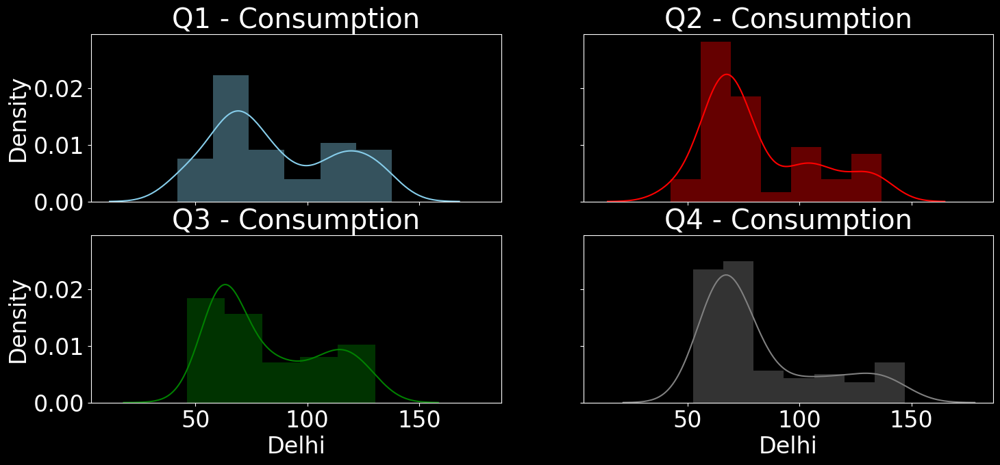

In [32]:
Q1 = df1[df1["Quarter"]==1]
Q2 = df1[df1["Quarter"]==2]
Q3 = df1[df1["Quarter"]==3]
Q4 = df1[df1["Quarter"]==4]

#Plot
fig,axes = plt.subplots(2,2,figsize=(17,7),sharex=True,sharey=True)

sns.distplot(Q1["Delhi"],color="skyblue", ax=axes[0,0]).set_title("Q1 - Consumption")
sns.distplot(Q2["Delhi"],color="red", ax=axes[0,1]).set_title("Q2 - Consumption")
sns.distplot(Q3["Delhi"],color="green", ax=axes[1,0]).set_title("Q3 - Consumption")
sns.distplot(Q4["Delhi"],color="gray", ax=axes[1,1]).set_title("Q4 - Consumption")

del Q1, Q2, Q3, Q4


In [33]:
delhi = pd.DataFrame(data=df1,columns=['Delhi','DateTime'])
delhi.head()

,Delhi,DateTime
0,85.8,2019-01-02
1,85.5,2019-01-03
2,83.5,2019-01-04
3,79.2,2019-01-05
4,76.6,2019-01-06


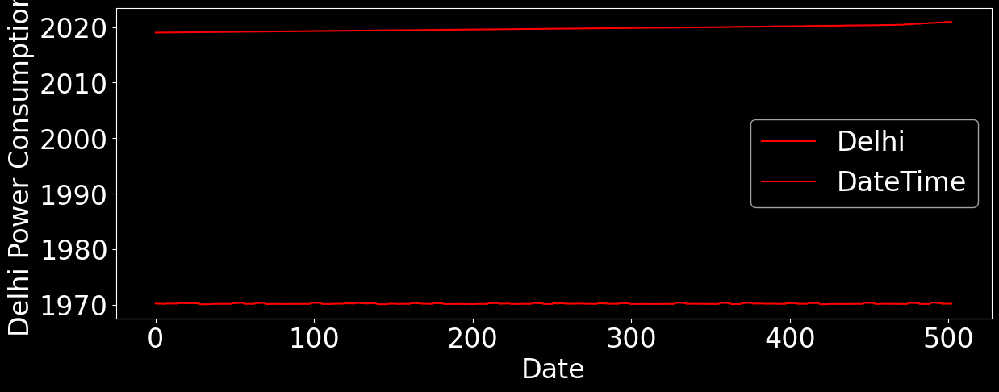

In [34]:
delhi.plot(figsize=(14,5),color='Red')
plt.xlabel('Date')
plt.ylabel('Delhi Power Consumption')
plt.show()

In [35]:
df2 = pd.DataFrame(data=df1,columns=['Delhi','DateTime'])

df2.rename(columns={"DateTime" : "ds", "Delhi" : "y"},inplace=True)
df2.head()

,y,ds
0,85.8,2019-01-02
1,85.5,2019-01-03
2,83.5,2019-01-04
3,79.2,2019-01-05
4,76.6,2019-01-06


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp5g3j3xn5/6jjlkxuq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp5g3j3xn5/qv2_m04d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93162', 'data', 'file=/tmp/tmp5g3j3xn5/6jjlkxuq.json', 'init=/tmp/tmp5g3j3xn5/qv2_m04d.json', 'output', 'file=/tmp/tmp5g3j3xn5/prophet_modelozt_mnds/prophet_model-20240904132543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:25:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:25:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
/usr/local/lib/python3.10/dist-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in 

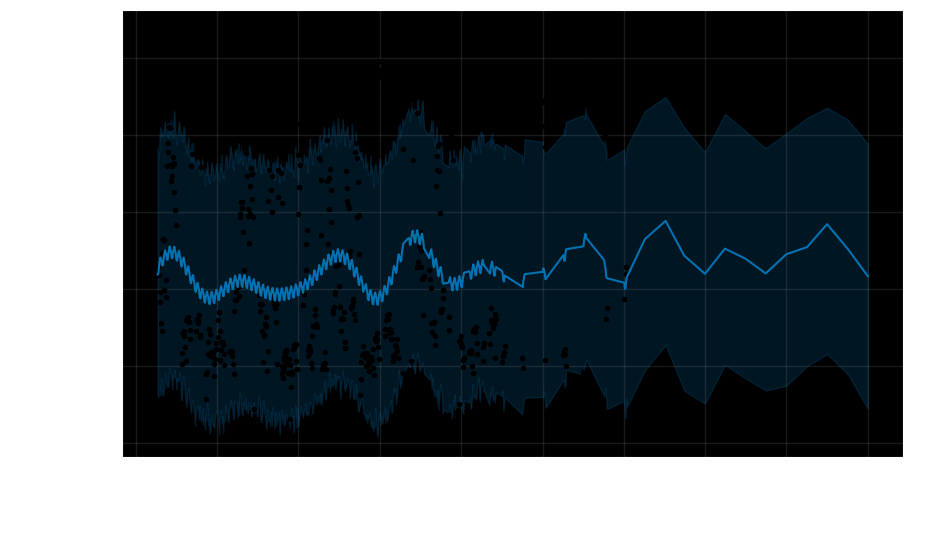

In [36]:
from prophet import Prophet
model = Prophet(seasonality_mode='multiplicative',yearly_seasonality=4)
model.fit(df2)
future = model.make_future_dataframe(periods=12 * 1, freq='MS')  #
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

/usr/local/lib/python3.10/dist-packages/prophet/plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/usr/local/lib/python3.10/dist-packages/prophet/plot.py:351: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
/usr/local/lib/python3.10/dist-packages/prophet/plot.py:354: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` o

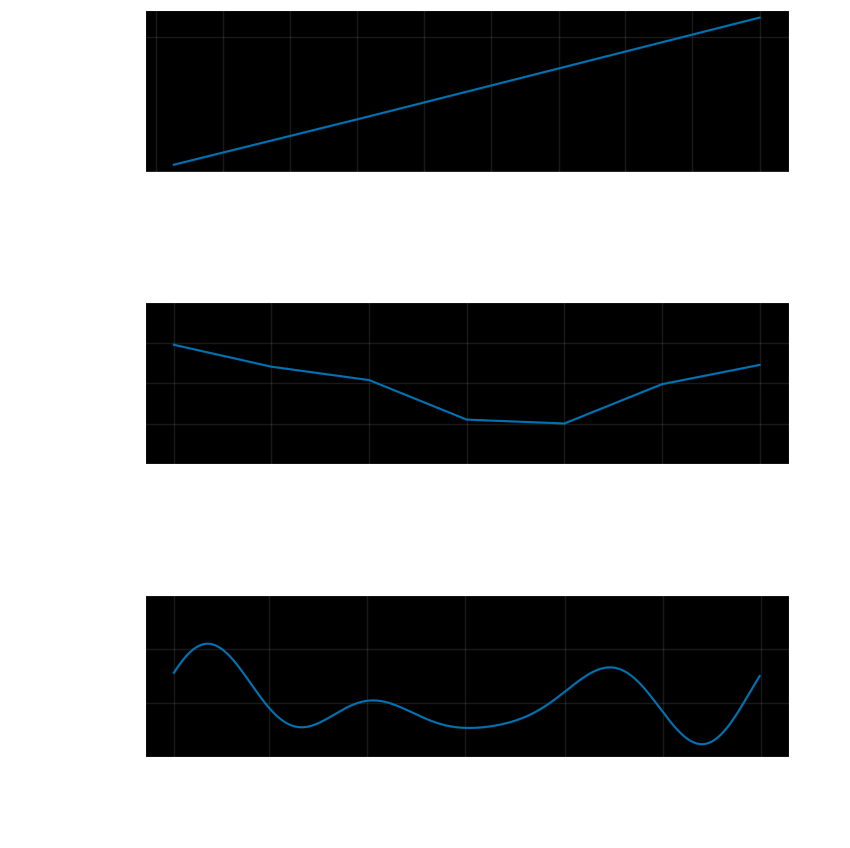

In [37]:
fig_a2 = model.plot_components(forecast)
plt.show()

/usr/local/lib/python3.10/dist-packages/prophet/plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/usr/local/lib/python3.10/dist-packages/prophet/plot.py:351: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
/usr/local/lib/python3.10/dist-packages/prophet/plot.py:354: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` o

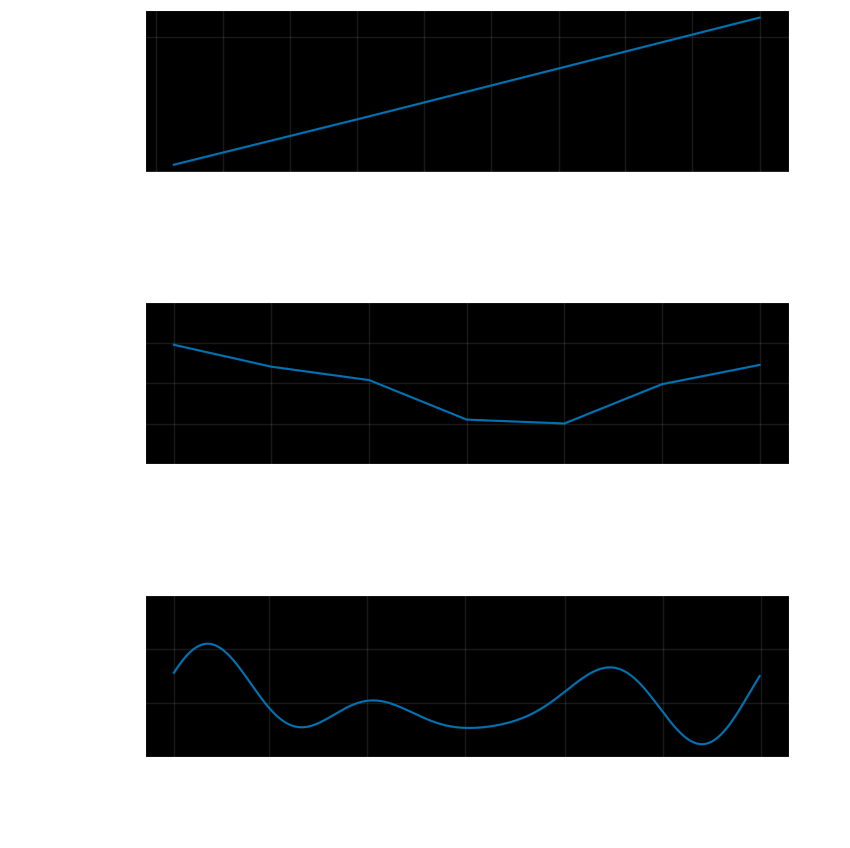

In [38]:
fig_m2 = model.plot_components(forecast)
plt.show()